In [1]:
# import sys
# IN_COLAB = 'google.colab' in sys.modules

# if IN_COLAB:
#     !pip install deriva
#     !pip install bdbag
#     !pip install --upgrade --force pydantic
#     !pip install git+https://github.com/informatics-isi-edu/deriva-ml git+https://github.com/informatics-isi-edu/eye-ai-ml

In [2]:
repo_dir = "Repos"   # Set this to be where your github repos are located.
%load_ext autoreload
%autoreload 2

# Update the load path so python can find modules for the model
import sys
from pathlib import Path
sys.path.insert(0, str(Path.home() / repo_dir / "eye-ai-ml"))

In [3]:
# Prerequisites

import json
import os
from eye_ai.eye_ai import EyeAI
import pandas as pd
from pathlib import Path, PurePath
import logging
# import torch

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s', force=True)

In [4]:

from deriva.core.utils.globus_auth_utils import GlobusNativeLogin
catalog_id = "eye-ai" #@param
host = 'www.eye-ai.org'


gnl = GlobusNativeLogin(host=host)
if gnl.is_logged_in([host]):
    print("You are already logged in.")
else:
    gnl.login([host], no_local_server=True, no_browser=True, refresh_tokens=True, update_bdbag_keychain=True)
    print("Login Successful")

2024-06-29 10:03:34,289 - INFO - Creating client of type <class 'globus_sdk.services.auth.client.native_client.NativeAppAuthClient'> for service "auth"
2024-06-29 10:03:34,289 - INFO - Finished initializing AuthLoginClient. client_id='8ef15ba9-2b4a-469c-a163-7fd910c9d111', type(authorizer)=<class 'globus_sdk.authorizers.base.NullAuthorizer'>


You are already logged in.


In [5]:
# Variables to configure the rest of the notebook.

cache_dir = '/data'        # Directory in which to cache materialized BDBags for datasets
working_dir = '/data'    # Directory in which to place output files for later upload.

configuration_rid = "2-C8W6" # rid
# Change the confi_file with bag_url=["minid: train", "minid: Valid", "minid: test"]



In [6]:
EA = EyeAI(hostname = host, catalog_id = catalog_id, cache_dir= cache_dir, working_dir=working_dir)

2024-06-29 10:03:36,153 - INFO - Creating client of type <class 'globus_sdk.services.auth.client.native_client.NativeAppAuthClient'> for service "auth"
2024-06-29 10:03:36,154 - INFO - Finished initializing AuthLoginClient. client_id='8ef15ba9-2b4a-469c-a163-7fd910c9d111', type(authorizer)=<class 'globus_sdk.authorizers.base.NullAuthorizer'>


In [7]:
# @title Initiate an Execution
configuration_records = EA.execution_init(configuration_rid=configuration_rid)
configuration_records.model_dump()

2024-06-29 10:03:38,002 - INFO - File [/data/sreenidhi/EyeAI_working/Execution_Metadata/Execution_Config-vgg19_catalog_model_training_LACDHS_quality_sreenidhi_june_27_2024.json] transfer successful. 0.95 KB transferred. Elapsed time: 0:00:00.000062.
2024-06-29 10:03:38,002 - INFO - Verifying MD5 checksum for downloaded file [/data/sreenidhi/EyeAI_working/Execution_Metadata/Execution_Config-vgg19_catalog_model_training_LACDHS_quality_sreenidhi_june_27_2024.json]
2024-06-29 10:03:38,041 - INFO - Configuration validation successful!
2024-06-29 10:03:44,022 - INFO - File [/data/sreenidhi/EyeAI_working/Execution_Assets/best_hyperparameters_exluding_no_optic_disc_images_june_24_2024.json] transfer successful. 0.69 KB transferred. Elapsed time: 0:00:00.000097.
2024-06-29 10:03:44,022 - INFO - Verifying SHA256 checksum for downloaded file [/data/sreenidhi/EyeAI_working/Execution_Assets/best_hyperparameters_exluding_no_optic_disc_images_june_24_2024.json]
2024-06-29 10:03:44,249 - INFO - File [

{'caching_dir': PosixPath('/data'),
 'working_dir': PosixPath('/data/sreenidhi/EyeAI_working'),
 'vocabs': {'Workflow_Type': [{'name': 'VGG19_Catalog_Model_LACDHS_quality_training',
    'rid': '2-C8WA'}],
  'Execution_Asset_Type': [{'name': 'VGG19_Catalog_Model_LACDHS_quality_training',
    'rid': '2-C8WC'}]},
 'execution_rid': '2-C8Z2',
 'workflow_rid': '2-C8WE',
 'bag_paths': [PosixPath('/data/2-277G_6aa1a6861eee5a79bce4bf071065355f95a066c2a1ff326089d43048a7e0f185/Dataset_2-277G'),
  PosixPath('/data/2-277J_81c873a311aa6a67cf2eef44bd9056cb19181b299a6e44327ea3553616f18725/Dataset_2-277J'),
  PosixPath('/data/2-277M_8c4b855c2752e098580a5bb0d1b63a8cedde4462805fe74cddc912a72fb39963/Dataset_2-277M')],
 'assets_paths': [PosixPath('/data/sreenidhi/EyeAI_working/Execution_Assets/best_hyperparameters_exluding_no_optic_disc_images_june_24_2024.json'),
  PosixPath('/data/sreenidhi/EyeAI_working/Execution_Assets/train_no_optic_disc_image_ids.csv'),
  PosixPath('/data/sreenidhi/EyeAI_working/Exec

In [8]:
configuration_records

ConfigurationRecord(caching_dir=PosixPath('/data'), working_dir=PosixPath('/data/sreenidhi/EyeAI_working'), vocabs={'Workflow_Type': [Term(name='VGG19_Catalog_Model_LACDHS_quality_training', rid='2-C8WA')], 'Execution_Asset_Type': [Term(name='VGG19_Catalog_Model_LACDHS_quality_training', rid='2-C8WC')]}, execution_rid='2-C8Z2', workflow_rid='2-C8WE', bag_paths=[PosixPath('/data/2-277G_6aa1a6861eee5a79bce4bf071065355f95a066c2a1ff326089d43048a7e0f185/Dataset_2-277G'), PosixPath('/data/2-277J_81c873a311aa6a67cf2eef44bd9056cb19181b299a6e44327ea3553616f18725/Dataset_2-277J'), PosixPath('/data/2-277M_8c4b855c2752e098580a5bb0d1b63a8cedde4462805fe74cddc912a72fb39963/Dataset_2-277M')], assets_paths=[PosixPath('/data/sreenidhi/EyeAI_working/Execution_Assets/best_hyperparameters_exluding_no_optic_disc_images_june_24_2024.json'), PosixPath('/data/sreenidhi/EyeAI_working/Execution_Assets/train_no_optic_disc_image_ids.csv'), PosixPath('/data/sreenidhi/EyeAI_working/Execution_Assets/valid_no_optic_di

In [9]:
exclude_train = pd.read_csv(configuration_records.assets_paths[1])['ID'].to_list()
exclude_valid = pd.read_csv(configuration_records.assets_paths[2])['ID'].to_list()

In [10]:
train_dir=str(configuration_records.bag_paths[0]) 

print(train_dir)

subject_csv_path = os.path.join(train_dir, 'data', 'Subject.csv')

subject_df = pd.read_csv(subject_csv_path)
subject_df

subject_df.Subject_image_quality.unique()

/data/2-277G_6aa1a6861eee5a79bce4bf071065355f95a066c2a1ff326089d43048a7e0f185/Dataset_2-277G


array(['69XP', '69XJ', '69XT', '69XM', '69XR', nan], dtype=object)

# 4 classes and Full fundus

In [12]:



# import os
# import shutil
# import pandas as pd
# from pathlib import Path

# def create_LACDHS_quality_dataset(train_dir: str, validation_dir: str, test_dir: str, output_dir: str, exclude_train: list = [], exclude_valid: list = []) -> tuple:
#     """
#     Creates a dataset for LACDHS image quality classification by organizing images into train, valid, and test folders
#     based on their Subject_image_quality from the subject table.

#     Parameters:
#     - train_dir (str): Path to the raw train dataset bag.
#     - validation_dir (str): Path to the raw validation dataset bag.
#     - test_dir (str): Path to the raw test dataset bag.
#     - output_dir (str): Path to the output directory where the organized dataset will be created.
#     - exclude_train (list): List of image RIDs to exclude from the train set.
#     - exclude_valid (list): List of image RIDs to exclude from the validation set.

#     Returns:
#     - tuple: A tuple containing the paths to the train, validation, and test directories.
#     """
#     def process_dataset(bag_path: str, output_subdir: str, exclude_list: list = []):
#         image_csv_path = os.path.join(bag_path, 'data', 'Image.csv')
#         observation_csv_path = os.path.join(bag_path, 'data', 'Observation.csv')
#         subject_csv_path = os.path.join(bag_path, 'data', 'Subject.csv')

#         image_df = pd.read_csv(image_csv_path)
#         observation_df = pd.read_csv(observation_csv_path)
#         subject_df = pd.read_csv(subject_csv_path)

#         # Merge dataframes
#         merged_df = image_df.merge(observation_df, left_on='Observation', right_on='RID')
#         merged_df = merged_df.merge(subject_df, left_on='Subject', right_on='RID')

#         # Filter for specific quality categories
#         quality_categories = ['69XP', '69XJ', '69XT', '69XM', '69XR']
#         merged_df = merged_df[merged_df['Subject_image_quality'].isin(quality_categories)]

#         image_root_path = os.path.join(bag_path, 'data', 'assets', 'Image')

#         for _, row in merged_df.iterrows():
#             if row['RID_x'] not in exclude_list:  # RID_x is the Image RID
#                 quality = row['Subject_image_quality']
#                 filename = row['Filename']
#                 src_path = os.path.join(image_root_path, filename)
#                 dst_dir = os.path.join(output_dir, output_subdir, quality)
#                 os.makedirs(dst_dir, exist_ok=True)
#                 dst_path = os.path.join(dst_dir, filename)
#                 shutil.copy2(src_path, dst_path)

#     # Process train dataset
#     process_dataset(train_dir, 'train', exclude_train)

#     # Process validation dataset
#     process_dataset(validation_dir, 'valid', exclude_valid)

#     # Process test dataset
#     process_dataset(test_dir, 'test')

#     train_path = os.path.join(output_dir, 'train')
#     valid_path = os.path.join(output_dir, 'valid')
#     test_path = os.path.join(output_dir, 'test')

#     return train_path, valid_path, test_path



import os
import shutil
import pandas as pd
from pathlib import Path, PurePath

def create_LACDHS_quality_dataset(train_dir: str, validation_dir: str, test_dir: str, output_dir: str, exclude_train: list = [], exclude_valid: list = []) -> tuple:
    """
    Creates a dataset for LACDHS image quality classification by organizing images into train, valid, and test folders
    based on their Subject_image_quality from the subject table, filtered for Field 2 images.

    Parameters:
    - train_dir (str): Path to the raw train dataset bag.
    - validation_dir (str): Path to the raw validation dataset bag.
    - test_dir (str): Path to the raw test dataset bag.
    - output_dir (str): Path to the output directory where the organized dataset will be created.
    - exclude_train (list): List of image RIDs to exclude from the train set.
    - exclude_valid (list): List of image RIDs to exclude from the validation set.

    Returns:
    - tuple: A tuple containing the paths to the train, validation, and test directories.
    """
    def filter_field_2(image_df):
        return image_df[image_df['Image_Angle_Vocab'] == "2SK6"]

    def process_dataset(bag_path: str, output_subdir: str, exclude_list: list = []):
        image_csv_path = os.path.join(bag_path, 'data', 'Image.csv')
        observation_csv_path = os.path.join(bag_path, 'data', 'Observation.csv')
        subject_csv_path = os.path.join(bag_path, 'data', 'Subject.csv')

        image_df = pd.read_csv(image_csv_path)
        observation_df = pd.read_csv(observation_csv_path)
        subject_df = pd.read_csv(subject_csv_path)

        # Filter for Field 2 images
        image_df = filter_field_2(image_df)

        # Merge dataframes
        merged_df = image_df.merge(observation_df, left_on='Observation', right_on='RID')
        merged_df = merged_df.merge(subject_df, left_on='Subject', right_on='RID')

        # Filter for specific quality categories
        quality_categories = ['69XP', '69XJ', '69XT', '69XM'] #, '69XR' very few images ignoring 
        merged_df = merged_df[merged_df['Subject_image_quality'].isin(quality_categories)]

        image_root_path = os.path.join(bag_path, 'data', 'assets', 'Image')

        for _, row in merged_df.iterrows():
            if row['RID_x'] not in exclude_list:  # RID_x is the Image RID
                quality = row['Subject_image_quality']
                filename = row['Filename']
                src_path = os.path.join(image_root_path, filename)
                dst_dir = os.path.join(output_dir, output_subdir, quality)
                os.makedirs(dst_dir, exist_ok=True)
                dst_path = os.path.join(dst_dir, filename)
                shutil.copy2(src_path, dst_path)

    # Process train dataset
    process_dataset(train_dir, 'train', exclude_train)

    # Process validation dataset
    process_dataset(validation_dir, 'valid', exclude_valid)

    # Process test dataset
    process_dataset(test_dir, 'test')

    train_path = os.path.join(output_dir, 'train')
    valid_path = os.path.join(output_dir, 'valid')
    test_path = os.path.join(output_dir, 'test')

    return train_path, valid_path, test_path



In [13]:
configuration_records.working_dir

PosixPath('/data/sreenidhi/EyeAI_working')

In [14]:
# @title Data Preprocessing (Filtering Image.csv for just Field_2 Images)
train_dir = configuration_records.bag_paths[0] # path to the raw train dataset
validation_dir = configuration_records.bag_paths[1]
test_dir = configuration_records.bag_paths[2]

exclude_train = pd.read_csv(configuration_records.assets_paths[1])['ID'].to_list()
exclude_valid = pd.read_csv(configuration_records.assets_paths[2])['ID'].to_list()

# Call the create_LACDHS_quality_dataset function
train_path, valid_path, test_path = create_LACDHS_quality_dataset(
    train_dir=str(configuration_records.bag_paths[0]),
    validation_dir=str(configuration_records.bag_paths[1]),
    test_dir=str(configuration_records.bag_paths[2]),
    output_dir=str(configuration_records.working_dir),
    exclude_train=exclude_train,
    exclude_valid=exclude_valid
)

# Print the paths to verify
print("Train dataset path:", train_path)
print("Validation dataset path:", valid_path)
print("Test dataset path:", test_path)

Train dataset path: /data/sreenidhi/EyeAI_working/train
Validation dataset path: /data/sreenidhi/EyeAI_working/valid
Test dataset path: /data/sreenidhi/EyeAI_working/test


In [15]:
import os

def count_files(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

def analyze_lacdhs_angle_dataset(base_path):
    main_folders = ['train', 'valid', 'test']
    
    for main_folder in main_folders:
        main_folder_path = os.path.join(base_path, main_folder)
        if not os.path.exists(main_folder_path):
            print(f"{main_folder} folder not found")
            continue
        
        print(f"\nAnalyzing {main_folder} folder:")
        
        total_files = 0
        for angle_folder in os.listdir(main_folder_path):
            angle_folder_path = os.path.join(main_folder_path, angle_folder)
            if os.path.isdir(angle_folder_path):
                file_count = count_files(angle_folder_path)
                print(f"  {angle_folder}: {file_count} images")
                total_files += file_count
        
        print(f"Total images in {main_folder}: {total_files}")

# Usage
base_path = "/data/sreenidhi/EyeAI_working/"
analyze_lacdhs_angle_dataset(base_path)



# All 5 classes 

# Analyzing train folder:
#   69XP: 12204 images
#   69XT: 4335 images
#   69XJ: 8507 images
#   69XM: 1189 images
#   69XR: 29 images
# Total images in train: 26264

# Analyzing valid folder:
#   69XP: 3585 images
#   69XT: 1477 images
#   69XJ: 3157 images
#   69XM: 389 images
#   69XR: 39 images
# Total images in valid: 8647

# Analyzing test folder:
#   69XP: 1411 images
#   69XJ: 1124 images
#   69XM: 123 images
#   69XT: 480 images
#   69XR: 6 images
# Total images in test: 3144


Analyzing train folder:
  69XP: 4042 images
  69XT: 1442 images
  69XJ: 2821 images
  69XM: 388 images
Total images in train: 8693

Analyzing valid folder:
  69XP: 1192 images
  69XT: 491 images
  69XJ: 1049 images
  69XM: 122 images
Total images in valid: 2854

Analyzing test folder:
  69XP: 470 images
  69XJ: 374 images
  69XM: 40 images
  69XT: 160 images
Total images in test: 1044



Visualizing samples from train folder:


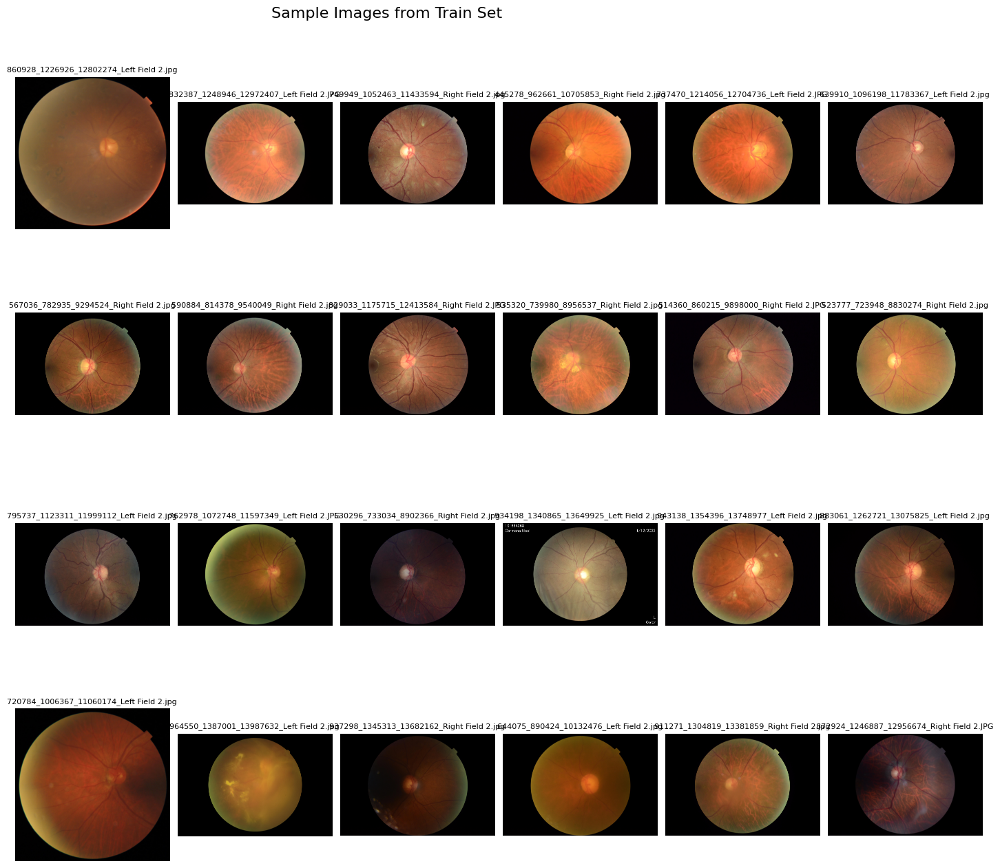

Angles in train set:
  - 69XP
  - 69XT
  - 69XJ
  - 69XM

Visualizing samples from valid folder:


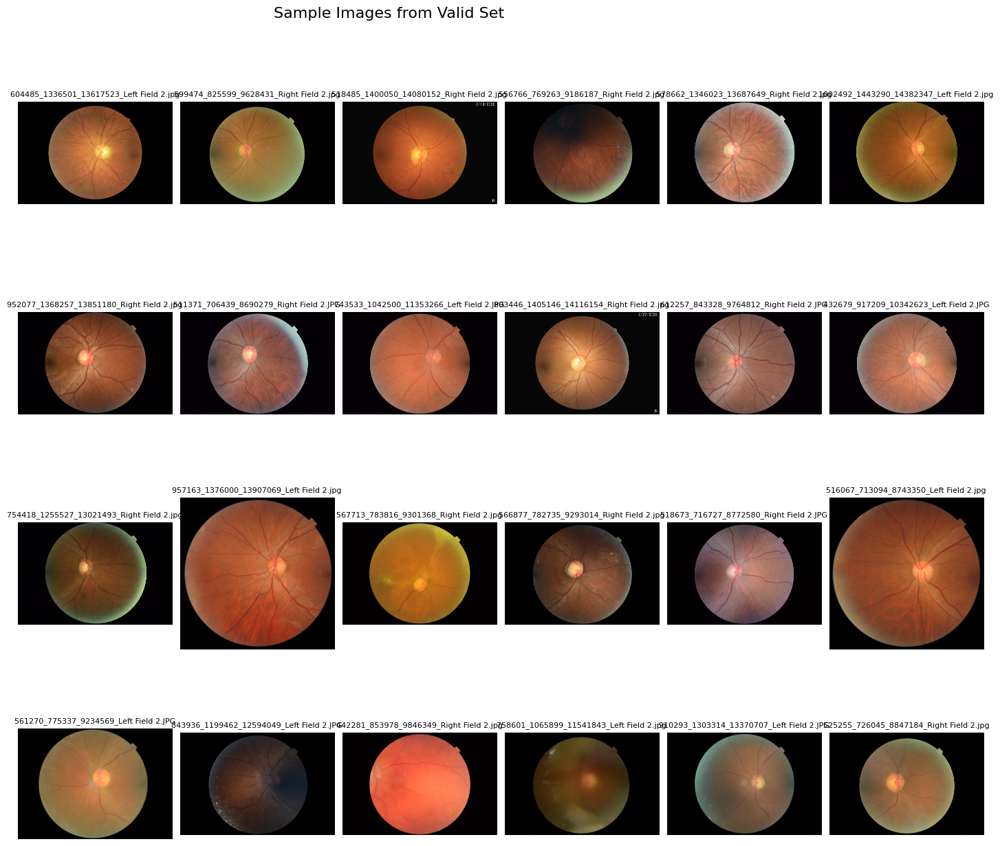

Angles in valid set:
  - 69XP
  - 69XT
  - 69XJ
  - 69XM

Visualizing samples from test folder:


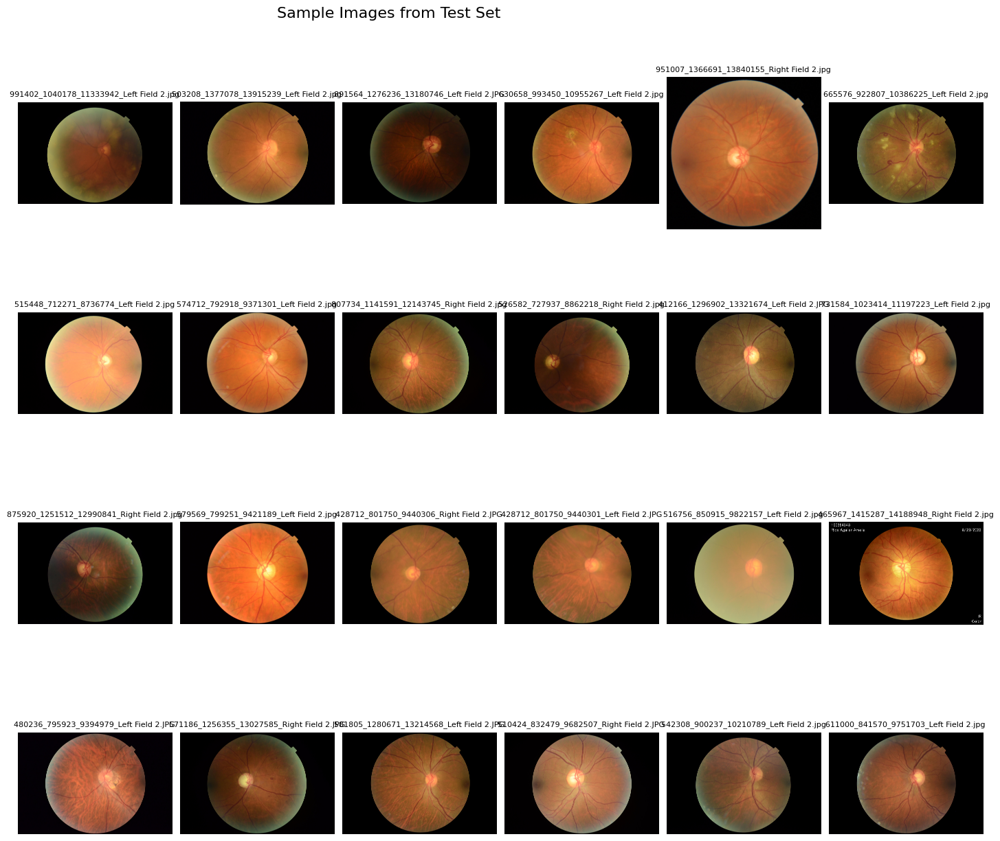

Angles in test set:
  - 69XP
  - 69XJ
  - 69XM
  - 69XT


In [16]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_lacdhs_quality_dataset(base_path, samples_per_angle=6):
    main_folders = ['train', 'valid', 'test']
    
    for main_folder in main_folders:
        main_folder_path = os.path.join(base_path, main_folder)
        if not os.path.exists(main_folder_path):
            print(f"{main_folder} folder not found")
            continue
        
        print(f"\nVisualizing samples from {main_folder} folder:")
        
        angle_folders = [f for f in os.listdir(main_folder_path) if os.path.isdir(os.path.join(main_folder_path, f))]
        
        # Calculate grid size
        n_angles = len(angle_folders)
        n_cols = samples_per_angle
        n_rows = n_angles
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3.5))
        fig.suptitle(f'Sample Images from {main_folder.capitalize()} Set', fontsize=16)
        
        for i, angle_folder in enumerate(angle_folders):
            angle_folder_path = os.path.join(main_folder_path, angle_folder)
            image_files = [f for f in os.listdir(angle_folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            
            if len(image_files) < samples_per_angle:
                print(f"Warning: Not enough images in {angle_folder}. Using all available images.")
                selected_files = image_files
            else:
                selected_files = random.sample(image_files, samples_per_angle)
            
            for j, image_file in enumerate(selected_files):
                img_path = os.path.join(angle_folder_path, image_file)
                img = Image.open(img_path)
                axes[i, j].imshow(img)
                axes[i, j].axis('off')
                
                # Add image filename as title for each subplot
                axes[i, j].set_title(image_file, fontsize=8)
                
                if j == 0:
                    axes[i, j].set_ylabel(angle_folder, rotation=0, labelpad=40, va='center', fontsize=10)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.95, bottom=0.05, left=0.2, right=0.98)
        plt.show()
        
        # Print confirmation of angles
        print(f"Angles in {main_folder} set:")
        for angle in angle_folders:
            print(f"  - {angle}")

# Usage
base_path = "/data/sreenidhi/EyeAI_working/"
visualize_lacdhs_quality_dataset(base_path)

In [17]:

output_path = str(EA.working_dir) + "/Execution_Assets/" + configuration_records.vocabs['Execution_Asset_Type'][0].name
os.mkdir(output_path)

In [18]:
output_path

'/data/sreenidhi/EyeAI_working/Execution_Assets/VGG19_Catalog_Model_LACDHS_quality_training'

In [19]:
best_hyper_parameters_json_path = str(configuration_records.assets_paths[0])

In [20]:
best_hyper_parameters_json_path

'/data/sreenidhi/EyeAI_working/Execution_Assets/best_hyperparameters_exluding_no_optic_disc_images_june_24_2024.json'

In [21]:
import json

# Open and load the JSON file
with open(best_hyper_parameters_json_path, 'r') as file:
    data = json.load(file)

# Print the contents of the JSON file
print(json.dumps(data, indent=4))

{
    "rotation_range": -6,
    "width_shift_range": 0.049283662164352315,
    "height_shift_range": 0.062129040368351915,
    "horizontal_flip": true,
    "vertical_flip": true,
    "zoom_range": -0.03493437617512693,
    "brightness_range": 0.016808387649284325,
    "use_class_weights": true,
    "pooling": "global_average",
    "dense_layers": 2,
    "units_layer_0": 512,
    "activation_func_0": "sigmoid",
    "batch_norm_0": true,
    "dropout_0": 0.10646478371824658,
    "units_layer_1": 64,
    "activation_func_1": "relu",
    "batch_norm_1": false,
    "dropout_1": 0.2830490167548361,
    "fine_tune_at": 0,
    "fine_tuning_learning_rate_adam": 1.1688327470992886e-05,
    "batch_size": 32
}


In [23]:
# @title Execute Training algorithm

from eye_ai.models.vgg19_lacdhs_quality_train import main

with EA.execution(execution_rid=configuration_records.execution_rid) as exec:
  main(train_path=train_path,
       valid_path=valid_path, 
       test_path=test_path, 
       output_path=output_path,
       best_hyperparameters_json_path=best_hyper_parameters_json_path,
       model_name="VGG19_Catalog_LAC_DHS_Quality_Trained_model_June_28_2024_without_H_and_V_angle_flips"
      )


Found 8693 images belonging to 4 classes.
Found 2854 images belonging to 4 classes.
Found 1044 images belonging to 4 classes.
train_generator.class_indices :  {'69XT': 0, '69XP': 1, '69XJ': 2, '69XM': 3}
validation_generator.class_indices :  {'69XT': 0, '69XP': 1, '69XJ': 2, '69XM': 3}
test_generator.class_indices :  {'69XT': 0, '69XP': 1, '69XJ': 2, '69XM': 3}
Epoch 1/100
272/272 [==============================] - 247s 876ms/step - loss: 1.3650 - roc_auc_score: 0.6567 - accuracy_score: 0.3239 - f1_score_metric: 0.2935 - val_loss: 1.2718 - val_roc_auc_score: 0.7161 - val_accuracy_score: 0.3942 - val_f1_score_metric: 0.3285
Epoch 2/100
272/272 [==============================] - 205s 745ms/step - loss: 1.1585 - roc_auc_score: 0.7215 - accuracy_score: 0.3792 - f1_score_metric: 0.3511 - val_loss: 3.4552 - val_roc_auc_score: 0.6857 - val_accuracy_score: 0.2348 - val_f1_score_metric: 0.1819
Epoch 3/100
272/272 [==============================] - 209s 753ms/step - loss: 1.1347 - roc_auc_score:

2024-06-29 09:14:02,447 - INFO - Test results - [1.2573058605194092, 0.7569302320480347, 0.4013409912586212, 0.34672725200653076]


Model Eval results: [1.2573058605194092, 0.7569302320480347, 0.4013409912586212, 0.34672725200653076]
33/33 [==============================] - 40s 1s/step


2024-06-29 09:14:44,064 - INFO - Detailed Classification Report:
2024-06-29 09:14:44,065 - INFO - {
  "69XT": {
    "precision": 0.1566265060240964,
    "recall": 0.08125,
    "f1-score": 0.10699588477366255,
    "support": 160.0
  },
  "69XP": {
    "precision": 0.40782122905027934,
    "recall": 0.15531914893617021,
    "f1-score": 0.22496147919876733,
    "support": 470.0
  },
  "69XJ": {
    "precision": 0.3273809523809524,
    "recall": 0.4411764705882353,
    "f1-score": 0.37585421412300685,
    "support": 374.0
  },
  "69XM": {
    "precision": 0.03237410071942446,
    "recall": 0.225,
    "f1-score": 0.05660377358490566,
    "support": 40.0
  },
  "accuracy": 0.24904214559386972,
  "macro avg": {
    "precision": 0.23105069704368814,
    "recall": 0.22568640488110137,
    "f1-score": 0.1911038379200856,
    "support": 1044.0
  },
  "weighted avg": {
    "precision": 0.32612227857925274,
    "recall": 0.24904214559386972,
    "f1-score": 0.2544874174450263,
    "support": 1044.0

In [24]:
data

{'rotation_range': -6,
 'width_shift_range': 0.049283662164352315,
 'height_shift_range': 0.062129040368351915,
 'horizontal_flip': True,
 'vertical_flip': True,
 'zoom_range': -0.03493437617512693,
 'brightness_range': 0.016808387649284325,
 'use_class_weights': True,
 'pooling': 'global_average',
 'dense_layers': 2,
 'units_layer_0': 512,
 'activation_func_0': 'sigmoid',
 'batch_norm_0': True,
 'dropout_0': 0.10646478371824658,
 'units_layer_1': 64,
 'activation_func_1': 'relu',
 'batch_norm_1': False,
 'dropout_1': 0.2830490167548361,
 'fine_tune_at': 0,
 'fine_tuning_learning_rate_adam': 1.1688327470992886e-05,
 'batch_size': 32}

In [26]:
# @title Execute Evaluation algorithm
from eye_ai.models.vgg19_lacdhs_quality_predict import evaluate_model
with EA.execution(execution_rid=configuration_records.execution_rid) as exec:
    evaluate_model(
        model_path=output_path + '/VGG19_Catalog_LAC_DHS_Quality_Trained_model_June_28_2024_without_H_and_V_angle_flips.h5',
        test_path=test_path,
        output_path=output_path,
        best_params=data
    )

Found 1044 images belonging to 4 classes.
33/33 [==============================] - 40s 1s/step - loss: 1.2573 - roc_auc_score: 0.7569 - accuracy_score: 0.4013 - f1_score_metric: 0.1610


2024-06-29 09:21:35,940 - INFO - loss: 1.2573055028915405
2024-06-29 09:21:35,941 - INFO - roc_auc_score: 0.7569302320480347
2024-06-29 09:21:35,941 - INFO - accuracy_score: 0.4013409912586212
2024-06-29 09:21:35,942 - INFO - f1_score_metric: 0.16104990243911743


loss: 1.2573055028915405
roc_auc_score: 0.7569302320480347
accuracy_score: 0.4013409912586212
f1_score_metric: 0.16104990243911743
33/33 [==============================] - 40s 1s/step


2024-06-29 09:22:17,473 - INFO - 
Detailed Metrics:
2024-06-29 09:22:17,474 - INFO - Accuracy: 0.4013409961685824
2024-06-29 09:22:17,474 - INFO - Macro Precision: 0.4441201817438154
2024-06-29 09:22:17,475 - INFO - Macro Recall: 0.4842322434292866
2024-06-29 09:22:17,476 - INFO - Macro F1 Score: 0.3668934835260217
2024-06-29 09:22:17,476 - INFO - Weighted F1 Score: 0.40736111865253244
2024-06-29 09:22:17,490 - INFO - Classification Report:
2024-06-29 09:22:17,490 - INFO - {
  "69XT": {
    "precision": 0.6144578313253012,
    "recall": 0.31875,
    "f1-score": 0.41975308641975306,
    "support": 160.0
  },
  "69XP": {
    "precision": 0.5921787709497207,
    "recall": 0.225531914893617,
    "f1-score": 0.3266563944530046,
    "support": 470.0
  },
  "69XJ": {
    "precision": 0.4583333333333333,
    "recall": 0.6176470588235294,
    "f1-score": 0.5261958997722096,
    "support": 374.0
  },
  "69XM": {
    "precision": 0.11151079136690648,
    "recall": 0.775,
    "f1-score": 0.1949685


Detailed Metrics:
Accuracy: 0.4013409961685824
Macro Precision: 0.4441201817438154
Macro Recall: 0.4842322434292866
Macro F1 Score: 0.3668934835260217
Weighted F1 Score: 0.40736111865253244

Classification Report:
              precision    recall  f1-score   support

        69XT       0.61      0.32      0.42       160
        69XP       0.59      0.23      0.33       470
        69XJ       0.46      0.62      0.53       374
        69XM       0.11      0.78      0.19        40

    accuracy                           0.40      1044
   macro avg       0.44      0.48      0.37      1044
weighted avg       0.53      0.40      0.41      1044

Macro-averaged ROC AUC: 0.7568167699079661
Predictions saved to quality_predictions.csv
Confusion matrix saved as confusion_matrix.png (300 DPI)
ROC curves saved as roc_curves.png (300 DPI)


# 4 classes and Full fundus --- cropped to eye

In [11]:
import os
import shutil
import pandas as pd
import cv2
import numpy as np
from pathlib import Path, PurePath

def crop_to_eye(im):
    mask = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(mask, 10, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    max_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(max_contour)
    cropped_im = im[y:y + h, x:x + w]
    return cropped_im

def create_LACDHS_quality_dataset(train_dir: str, validation_dir: str, test_dir: str, output_dir: str, exclude_train: list = [], exclude_valid: list = []) -> tuple:
    """
    Creates a dataset for LACDHS image quality classification by organizing images into train, valid, and test folders
    based on their Subject_image_quality from the subject table, filtered for Field 2 images and cropped to the eye.

    Parameters:
    - train_dir (str): Path to the raw train dataset bag.
    - validation_dir (str): Path to the raw validation dataset bag.
    - test_dir (str): Path to the raw test dataset bag.
    - output_dir (str): Path to the output directory where the organized dataset will be created.
    - exclude_train (list): List of image RIDs to exclude from the train set.
    - exclude_valid (list): List of image RIDs to exclude from the validation set.

    Returns:
    - tuple: A tuple containing the paths to the train, validation, and test directories.
    """
    def filter_field_2(image_df):
        return image_df[image_df['Image_Angle_Vocab'] == "2SK6"]

    def process_dataset(bag_path: str, output_subdir: str, exclude_list: list = []):
        image_csv_path = os.path.join(bag_path, 'data', 'Image.csv')
        observation_csv_path = os.path.join(bag_path, 'data', 'Observation.csv')
        subject_csv_path = os.path.join(bag_path, 'data', 'Subject.csv')

        image_df = pd.read_csv(image_csv_path)
        observation_df = pd.read_csv(observation_csv_path)
        subject_df = pd.read_csv(subject_csv_path)

        # Filter for Field 2 images
        image_df = filter_field_2(image_df)

        # Merge dataframes
        merged_df = image_df.merge(observation_df, left_on='Observation', right_on='RID')
        merged_df = merged_df.merge(subject_df, left_on='Subject', right_on='RID')

        # Filter for specific quality categories
        quality_categories = ['69XP', '69XJ', '69XT', '69XM', '69XR']
        merged_df = merged_df[merged_df['Subject_image_quality'].isin(quality_categories)]

        image_root_path = os.path.join(bag_path, 'data', 'assets', 'Image')

        for _, row in merged_df.iterrows():
            if row['RID_x'] not in exclude_list:  # RID_x is the Image RID
                quality = row['Subject_image_quality']
                filename = row['Filename']
                src_path = os.path.join(image_root_path, filename)
                
                # Read the image
                img = cv2.imread(src_path)
                if img is None:
                    print(f"Warning: Could not read image {src_path}")
                    continue
                
                # Crop the image to the eye
                cropped_img = crop_to_eye(img)
                
                dst_dir = os.path.join(output_dir, output_subdir, quality)
                os.makedirs(dst_dir, exist_ok=True)
                dst_path = os.path.join(dst_dir, filename)
                
                # Save the cropped image
                cv2.imwrite(dst_path, cropped_img)

    # Process train dataset
    process_dataset(train_dir, 'train', exclude_train)

    # Process validation dataset
    process_dataset(validation_dir, 'valid', exclude_valid)

    # Process test dataset
    process_dataset(test_dir, 'test')

    train_path = os.path.join(output_dir, 'train')
    valid_path = os.path.join(output_dir, 'valid')
    test_path = os.path.join(output_dir, 'test')

    return train_path, valid_path, test_path



In [12]:
configuration_records.working_dir

PosixPath('/data/sreenidhi/EyeAI_working')

In [13]:
# @title Data Preprocessing (Filtering Image.csv for just Field_2 Images)
train_dir = configuration_records.bag_paths[0] # path to the raw train dataset
validation_dir = configuration_records.bag_paths[1]
test_dir = configuration_records.bag_paths[2]

exclude_train = pd.read_csv(configuration_records.assets_paths[1])['ID'].to_list()
exclude_valid = pd.read_csv(configuration_records.assets_paths[2])['ID'].to_list()

# Call the create_LACDHS_quality_dataset function
train_path, valid_path, test_path = create_LACDHS_quality_dataset(
    train_dir=str(configuration_records.bag_paths[0]),
    validation_dir=str(configuration_records.bag_paths[1]),
    test_dir=str(configuration_records.bag_paths[2]),
    output_dir=str(configuration_records.working_dir),
    exclude_train=exclude_train,
    exclude_valid=exclude_valid
)

# Print the paths to verify
print("Train dataset path:", train_path)
print("Validation dataset path:", valid_path)
print("Test dataset path:", test_path)

Train dataset path: /data/sreenidhi/EyeAI_working/train
Validation dataset path: /data/sreenidhi/EyeAI_working/valid
Test dataset path: /data/sreenidhi/EyeAI_working/test


In [14]:
import os

def count_files(directory):
    return len([name for name in os.listdir(directory) if os.path.isfile(os.path.join(directory, name))])

def analyze_lacdhs_angle_dataset(base_path):
    main_folders = ['train', 'valid', 'test']
    
    for main_folder in main_folders:
        main_folder_path = os.path.join(base_path, main_folder)
        if not os.path.exists(main_folder_path):
            print(f"{main_folder} folder not found")
            continue
        
        print(f"\nAnalyzing {main_folder} folder:")
        
        total_files = 0
        for angle_folder in os.listdir(main_folder_path):
            angle_folder_path = os.path.join(main_folder_path, angle_folder)
            if os.path.isdir(angle_folder_path):
                file_count = count_files(angle_folder_path)
                print(f"  {angle_folder}: {file_count} images")
                total_files += file_count
        
        print(f"Total images in {main_folder}: {total_files}")

# Usage
base_path = "/data/sreenidhi/EyeAI_working/"
analyze_lacdhs_angle_dataset(base_path)




Analyzing train folder:
  69XP: 4042 images
  69XT: 1442 images
  69XJ: 2821 images
  69XM: 388 images
  69XR: 9 images
Total images in train: 8702

Analyzing valid folder:
  69XP: 1192 images
  69XT: 491 images
  69XJ: 1049 images
  69XM: 122 images
  69XR: 11 images
Total images in valid: 2865

Analyzing test folder:
  69XP: 470 images
  69XJ: 374 images
  69XM: 40 images
  69XT: 160 images
  69XR: 2 images
Total images in test: 1046



Visualizing samples from train folder:


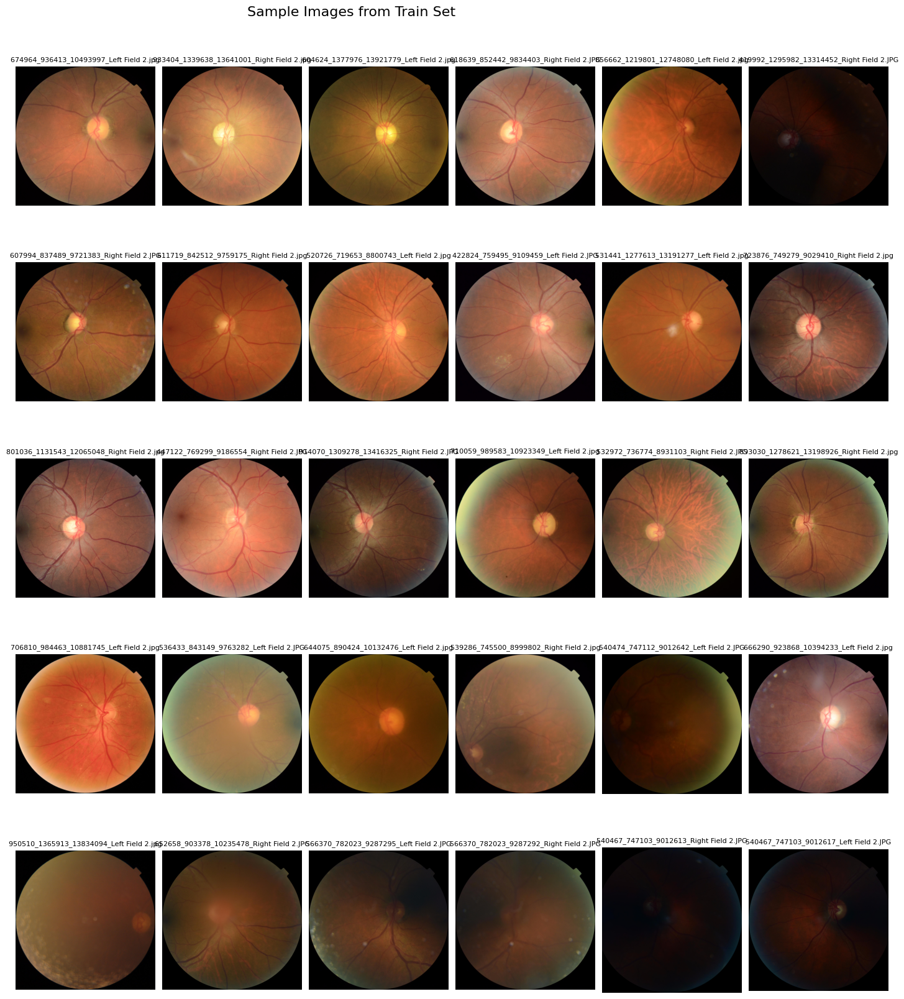

Angles in train set:
  - 69XP
  - 69XT
  - 69XJ
  - 69XM
  - 69XR

Visualizing samples from valid folder:


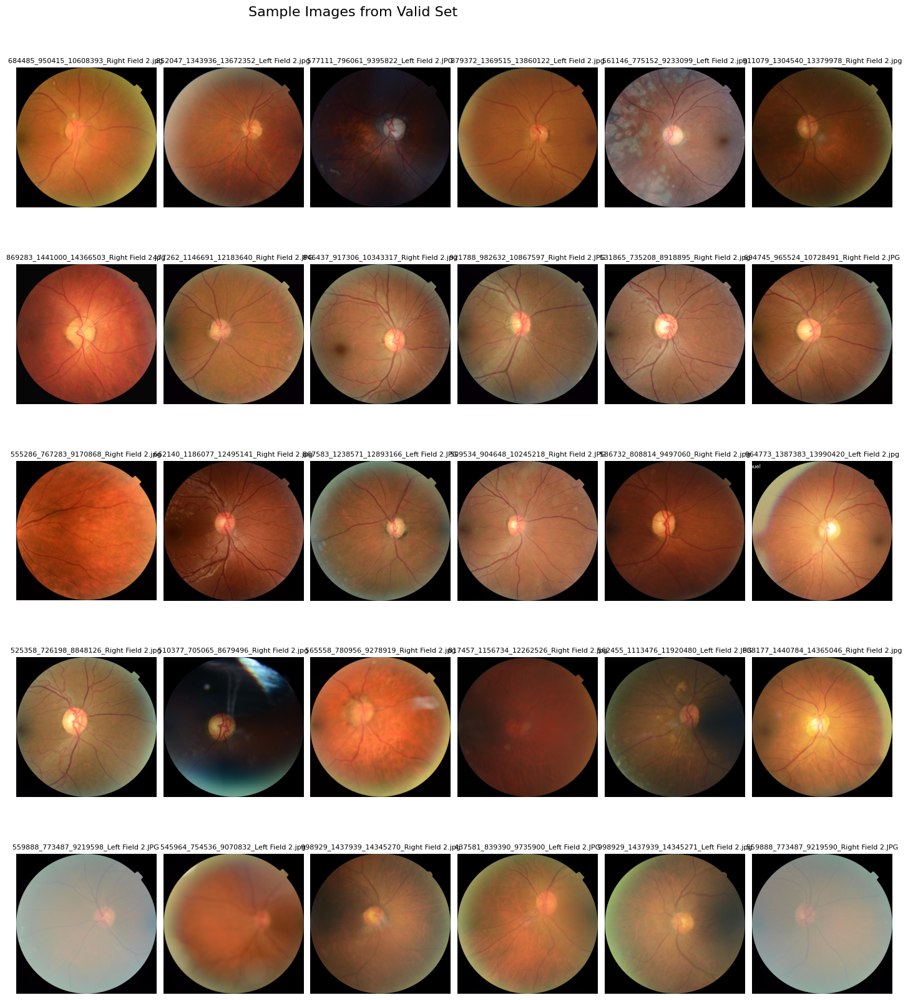

Angles in valid set:
  - 69XP
  - 69XT
  - 69XJ
  - 69XM
  - 69XR

Visualizing samples from test folder:


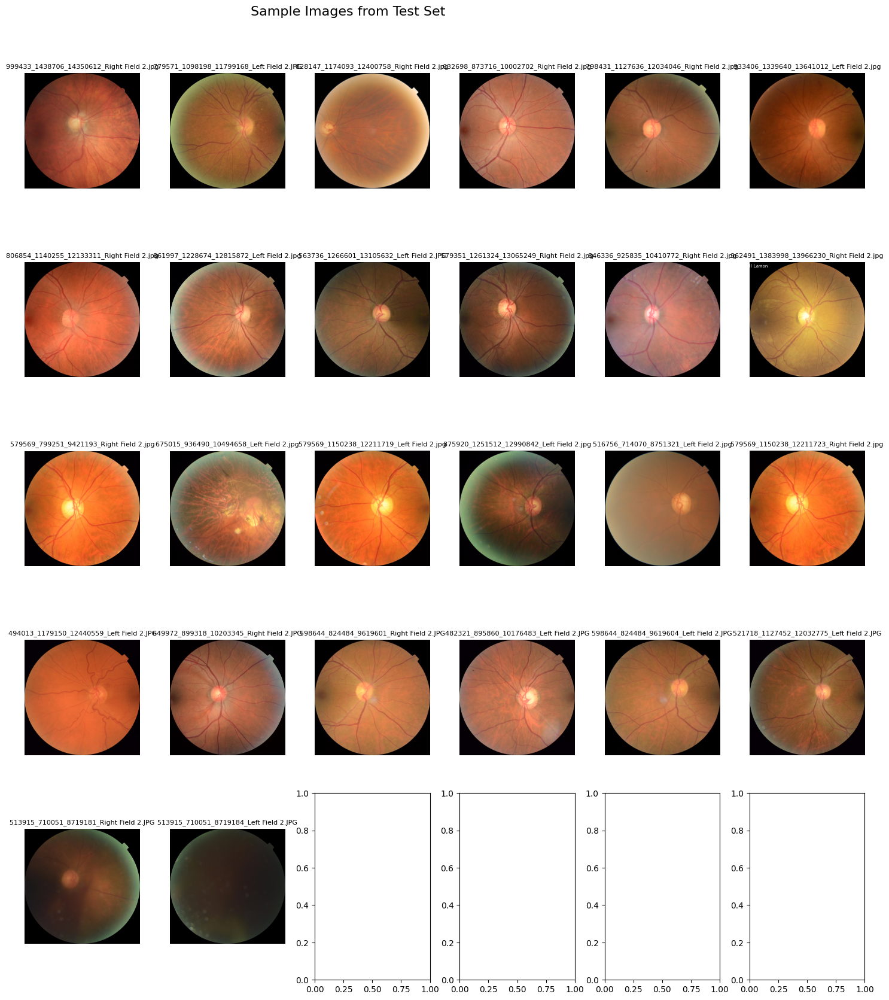

Angles in test set:
  - 69XP
  - 69XJ
  - 69XM
  - 69XT
  - 69XR


In [15]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_lacdhs_quality_dataset(base_path, samples_per_angle=6):
    main_folders = ['train', 'valid', 'test']
    
    for main_folder in main_folders:
        main_folder_path = os.path.join(base_path, main_folder)
        if not os.path.exists(main_folder_path):
            print(f"{main_folder} folder not found")
            continue
        
        print(f"\nVisualizing samples from {main_folder} folder:")
        
        angle_folders = [f for f in os.listdir(main_folder_path) if os.path.isdir(os.path.join(main_folder_path, f))]
        
        # Calculate grid size
        n_angles = len(angle_folders)
        n_cols = samples_per_angle
        n_rows = n_angles
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3.5))
        fig.suptitle(f'Sample Images from {main_folder.capitalize()} Set', fontsize=16)
        
        for i, angle_folder in enumerate(angle_folders):
            angle_folder_path = os.path.join(main_folder_path, angle_folder)
            image_files = [f for f in os.listdir(angle_folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
            
            if len(image_files) < samples_per_angle:
                print(f"Warning: Not enough images in {angle_folder}. Using all available images.")
                selected_files = image_files
            else:
                selected_files = random.sample(image_files, samples_per_angle)
            
            for j, image_file in enumerate(selected_files):
                img_path = os.path.join(angle_folder_path, image_file)
                img = Image.open(img_path)
                axes[i, j].imshow(img)
                axes[i, j].axis('off')
                
                # Add image filename as title for each subplot
                axes[i, j].set_title(image_file, fontsize=8)
                
                if j == 0:
                    axes[i, j].set_ylabel(angle_folder, rotation=0, labelpad=40, va='center', fontsize=10)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.95, bottom=0.05, left=0.2, right=0.98)
        plt.show()
        
        # Print confirmation of angles
        print(f"Angles in {main_folder} set:")
        for angle in angle_folders:
            print(f"  - {angle}")

# Usage
base_path = "/data/sreenidhi/EyeAI_working/"
visualize_lacdhs_quality_dataset(base_path)

In [16]:

output_path = str(EA.working_dir) + "/Execution_Assets/" + configuration_records.vocabs['Execution_Asset_Type'][0].name
os.mkdir(output_path)

In [17]:
output_path

'/data/sreenidhi/EyeAI_working/Execution_Assets/VGG19_Catalog_Model_LACDHS_quality_training'

In [18]:
best_hyper_parameters_json_path = str(configuration_records.assets_paths[0])

In [19]:
best_hyper_parameters_json_path

'/data/sreenidhi/EyeAI_working/Execution_Assets/best_hyperparameters_exluding_no_optic_disc_images_june_24_2024.json'

In [20]:
import json

# Open and load the JSON file
with open(best_hyper_parameters_json_path, 'r') as file:
    data = json.load(file)

# Print the contents of the JSON file
print(json.dumps(data, indent=4))

{
    "rotation_range": -6,
    "width_shift_range": 0.049283662164352315,
    "height_shift_range": 0.062129040368351915,
    "horizontal_flip": true,
    "vertical_flip": true,
    "zoom_range": -0.03493437617512693,
    "brightness_range": 0.016808387649284325,
    "use_class_weights": true,
    "pooling": "global_average",
    "dense_layers": 2,
    "units_layer_0": 512,
    "activation_func_0": "sigmoid",
    "batch_norm_0": true,
    "dropout_0": 0.10646478371824658,
    "units_layer_1": 64,
    "activation_func_1": "relu",
    "batch_norm_1": false,
    "dropout_1": 0.2830490167548361,
    "fine_tune_at": 0,
    "fine_tuning_learning_rate_adam": 1.1688327470992886e-05,
    "batch_size": 32
}


In [21]:
# @title Execute Training algorithm

from eye_ai.models.vgg19_lacdhs_quality_train import main

with EA.execution(execution_rid=configuration_records.execution_rid) as exec:
  main(train_path=train_path,
       valid_path=valid_path, 
       test_path=test_path, 
       output_path=output_path,
       best_hyperparameters_json_path=best_hyper_parameters_json_path,
       model_name="VGG19_Catalog_LAC_DHS_Quality_Trained_model_June_28_2024_without_H_and_V_angle_flips"
      )


2024-06-29 10:58:57.831655: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-29 10:58:57.831722: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-29 10:58:57.961524: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-29 10:58:58.241547: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-29 10:58:59.865334: W tensorflow/compiler/tf2

Found 8693 images belonging to 4 classes.
Found 2854 images belonging to 4 classes.
Found 1044 images belonging to 4 classes.
train_generator.class_indices :  {'69XT': 0, '69XP': 1, '69XJ': 2, '69XM': 3}
validation_generator.class_indices :  {'69XT': 0, '69XP': 1, '69XJ': 2, '69XM': 3}
test_generator.class_indices :  {'69XT': 0, '69XP': 1, '69XJ': 2, '69XM': 3}


2024-06-29 10:59:02.892953: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-29 10:59:02.961819: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-06-29 10:59:02.965518: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Epoch 1/100


2024-06-29 10:59:10.299734: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907
2024-06-29 10:59:16.648445: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f8a3d346ef0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-06-29 10:59:16.648476: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA A10G, Compute Capability 8.6
2024-06-29 10:59:16.693443: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1719683957.003103    9441 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


272/272 [==============================] - 215s 711ms/step - loss: 1.3649 - roc_auc_score: 0.6388 - accuracy_score: 0.3120 - f1_score_metric: 0.2800 - val_loss: 1.1758 - val_roc_auc_score: 0.6966 - val_accuracy_score: 0.4674 - val_f1_score_metric: 0.2950
Epoch 2/100
272/272 [==============================] - 199s 716ms/step - loss: 1.1867 - roc_auc_score: 0.7044 - accuracy_score: 0.3581 - f1_score_metric: 0.3258 - val_loss: 2.8698 - val_roc_auc_score: 0.6859 - val_accuracy_score: 0.2302 - val_f1_score_metric: 0.1640
Epoch 3/100
272/272 [==============================] - 229s 834ms/step - loss: 1.1323 - roc_auc_score: 0.7290 - accuracy_score: 0.3683 - f1_score_metric: 0.3433 - val_loss: 1.4907 - val_roc_auc_score: 0.7381 - val_accuracy_score: 0.3725 - val_f1_score_metric: 0.3056
Epoch 4/100
272/272 [==============================] - 230s 837ms/step - loss: 1.0802 - roc_auc_score: 0.7512 - accuracy_score: 0.4066 - f1_score_metric: 0.3776 - val_loss: 1.1995 - val_roc_auc_score: 0.7763 - v

2024-06-29 11:32:37,697 - INFO - Test results - [1.187134027481079, 0.6868060827255249, 0.4607279598712921, 0.3057980239391327]


Model Eval results: [1.187134027481079, 0.6868060827255249, 0.4607279598712921, 0.3057980239391327]
33/33 [==============================] - 38s 1s/step


2024-06-29 11:33:16,647 - INFO - Detailed Classification Report:
2024-06-29 11:33:16,649 - INFO - {
  "69XT": {
    "precision": 0.0,
    "recall": 0.0,
    "f1-score": 0.0,
    "support": 160.0
  },
  "69XP": {
    "precision": 0.46577946768060835,
    "recall": 0.5212765957446809,
    "f1-score": 0.4919678714859438,
    "support": 470.0
  },
  "69XJ": {
    "precision": 0.3717171717171717,
    "recall": 0.4919786096256685,
    "f1-score": 0.4234752589182969,
    "support": 374.0
  },
  "69XM": {
    "precision": 0.0,
    "recall": 0.0,
    "f1-score": 0.0,
    "support": 40.0
  },
  "accuracy": 0.4109195402298851,
  "macro avg": {
    "precision": 0.20937415984944502,
    "recall": 0.25331380134258735,
    "f1-score": 0.2288607826010602,
    "support": 1044.0
  },
  "weighted avg": {
    "precision": 0.3428530383449312,
    "recall": 0.4109195402298851,
    "f1-score": 0.3731845272354757,
    "support": 1044.0
  }
}
2024-06-29 11:33:16,653 - INFO - Macro F1 Score: 0.2288607826010602


In [22]:
data

{'rotation_range': -6,
 'width_shift_range': 0.049283662164352315,
 'height_shift_range': 0.062129040368351915,
 'horizontal_flip': True,
 'vertical_flip': True,
 'zoom_range': -0.03493437617512693,
 'brightness_range': 0.016808387649284325,
 'use_class_weights': True,
 'pooling': 'global_average',
 'dense_layers': 2,
 'units_layer_0': 512,
 'activation_func_0': 'sigmoid',
 'batch_norm_0': True,
 'dropout_0': 0.10646478371824658,
 'units_layer_1': 64,
 'activation_func_1': 'relu',
 'batch_norm_1': False,
 'dropout_1': 0.2830490167548361,
 'fine_tune_at': 0,
 'fine_tuning_learning_rate_adam': 1.1688327470992886e-05,
 'batch_size': 32}

In [23]:
# @title Execute Evaluation algorithm
from eye_ai.models.vgg19_lacdhs_quality_predict import evaluate_model
with EA.execution(execution_rid=configuration_records.execution_rid) as exec:
    evaluate_model(
        model_path=output_path + '/VGG19_Catalog_LAC_DHS_Quality_Trained_model_June_28_2024_without_H_and_V_angle_flips.h5',
        test_path=test_path,
        output_path=output_path,
        best_params=data
    )

Found 1044 images belonging to 4 classes.
33/33 [==============================] - 37s 1s/step - loss: 1.1871 - roc_auc_score: 0.6868 - accuracy_score: 0.4607 - f1_score_metric: 0.2650


2024-06-29 11:33:59,406 - INFO - loss: 1.1871330738067627
2024-06-29 11:33:59,407 - INFO - roc_auc_score: 0.6868060827255249
2024-06-29 11:33:59,407 - INFO - accuracy_score: 0.4607279598712921
2024-06-29 11:33:59,408 - INFO - f1_score_metric: 0.26498138904571533


loss: 1.1871330738067627
roc_auc_score: 0.6868060827255249
accuracy_score: 0.4607279598712921
f1_score_metric: 0.26498138904571533
33/33 [==============================] - 36s 1s/step


2024-06-29 11:34:36,770 - INFO - 
Detailed Metrics:
2024-06-29 11:34:36,770 - INFO - Accuracy: 0.460727969348659
2024-06-29 11:34:36,771 - INFO - Macro Precision: 0.5714051157967508
2024-06-29 11:34:36,771 - INFO - Macro Recall: 0.33088893076572984
2024-06-29 11:34:36,772 - INFO - Macro F1 Score: 0.31975626417919706
2024-06-29 11:34:36,773 - INFO - Weighted F1 Score: 0.42201894164867043
2024-06-29 11:34:36,786 - INFO - Classification Report:
2024-06-29 11:34:36,786 - INFO - {
  "69XT": {
    "precision": 1.0,
    "recall": 0.00625,
    "f1-score": 0.012422360248447204,
    "support": 160.0
  },
  "69XP": {
    "precision": 0.5038022813688213,
    "recall": 0.5638297872340425,
    "f1-score": 0.5321285140562249,
    "support": 470.0
  },
  "69XJ": {
    "precision": 0.41818181818181815,
    "recall": 0.553475935828877,
    "f1-score": 0.476409666283084,
    "support": 374.0
  },
  "69XM": {
    "precision": 0.36363636363636365,
    "recall": 0.2,
    "f1-score": 0.25806451612903225,
   


Detailed Metrics:
Accuracy: 0.460727969348659
Macro Precision: 0.5714051157967508
Macro Recall: 0.33088893076572984
Macro F1 Score: 0.31975626417919706
Weighted F1 Score: 0.42201894164867043

Classification Report:
              precision    recall  f1-score   support

        69XT       1.00      0.01      0.01       160
        69XP       0.50      0.56      0.53       470
        69XJ       0.42      0.55      0.48       374
        69XM       0.36      0.20      0.26        40

    accuracy                           0.46      1044
   macro avg       0.57      0.33      0.32      1044
weighted avg       0.54      0.46      0.42      1044

Macro-averaged ROC AUC: 0.6865035790619343
Predictions saved to quality_predictions.csv
Confusion matrix saved as confusion_matrix.png (300 DPI)
ROC curves saved as roc_curves.png (300 DPI)


# Third try sanity check

In [ ]:
import os
import shutil
import pandas as pd
import cv2
import numpy as np
from pathlib import Path, PurePath

def crop_to_eye(im):
    mask = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(mask, 10, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    max_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(max_contour)
    cropped_im = im[y:y + h, x:x + w]
    return cropped_im

def create_LACDHS_quality_dataset(train_dir: str, validation_dir: str, test_dir: str, output_dir: str, exclude_train: list = [], exclude_valid: list = []) -> tuple:
    """
    Creates a dataset for LACDHS image quality classification by organizing images into train, valid, and test folders
    based on their Subject_image_quality from the subject table, filtered for Field 2 images and cropped to the eye.

    Parameters:
    - train_dir (str): Path to the raw train dataset bag.
    - validation_dir (str): Path to the raw validation dataset bag.
    - test_dir (str): Path to the raw test dataset bag.
    - output_dir (str): Path to the output directory where the organized dataset will be created.
    - exclude_train (list): List of image RIDs to exclude from the train set.
    - exclude_valid (list): List of image RIDs to exclude from the validation set.

    Returns:
    - tuple: A tuple containing the paths to the train, validation, and test directories.
    """
    def filter_field_2(image_df):
        return image_df[image_df['Image_Angle_Vocab'] == "2SK6"]

    def process_dataset(bag_path: str, output_subdir: str, exclude_list: list = []):
        image_csv_path = os.path.join(bag_path, 'data', 'Image.csv')
        observation_csv_path = os.path.join(bag_path, 'data', 'Observation.csv')
        subject_csv_path = os.path.join(bag_path, 'data', 'Subject.csv')

        image_df = pd.read_csv(image_csv_path)
        observation_df = pd.read_csv(observation_csv_path)
        subject_df = pd.read_csv(subject_csv_path)

        # Filter for Field 2 images
        image_df = filter_field_2(image_df)

        # Merge dataframes
        merged_df = image_df.merge(observation_df, left_on='Observation', right_on='RID')
        merged_df = merged_df.merge(subject_df, left_on='Subject', right_on='RID')

        # Filter for specific quality categories
        quality_categories = ['69XP', '69XJ', '69XT', '69XM'] #, '69XR' ignoring becuase of very few images
        merged_df = merged_df[merged_df['Subject_image_quality'].isin(quality_categories)]

        image_root_path = os.path.join(bag_path, 'data', 'assets', 'Image')

        for _, row in merged_df.iterrows():
            if row['RID_x'] not in exclude_list:  # RID_x is the Image RID
                quality = row['Subject_image_quality']
                filename = row['Filename']
                src_path = os.path.join(image_root_path, filename)
                
                # Read the image
                img = cv2.imread(src_path)
                if img is None:
                    print(f"Warning: Could not read image {src_path}")
                    continue
                
                # Crop the image to the eye
                cropped_img = crop_to_eye(img)
                
                dst_dir = os.path.join(output_dir, output_subdir, quality)
                os.makedirs(dst_dir, exist_ok=True)
                dst_path = os.path.join(dst_dir, filename)
                
                # Save the cropped image
                cv2.imwrite(dst_path, cropped_img)

    # Process train dataset
    process_dataset(train_dir, 'train', exclude_train)

    # Process validation dataset
    process_dataset(validation_dir, 'valid', exclude_valid)

    # Process test dataset
    process_dataset(test_dir, 'test')

    train_path = os.path.join(output_dir, 'train')
    valid_path = os.path.join(output_dir, 'valid')
    test_path = os.path.join(output_dir, 'test')

    return train_path, valid_path, test_path



Found 8693 files belonging to 4 classes.
Found 2854 files belonging to 4 classes.
Found 1044 files belonging to 4 classes.
Class names: ['69XJ', '69XM', '69XP', '69XT']
Epoch 1/50
136/136 [==============================] - ETA: 0s - loss: 1.1673 - accuracy: 0.4649 - auc_4: 0.6169

2024-06-29 12:06:47,310 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 152s 1s/step - loss: 1.1673 - accuracy: 0.4649 - auc_4: 0.6169 - val_loss: 1.0242 - val_accuracy: 0.5228 - val_auc_4: 0.7495
Epoch 2/50
136/136 [==============================] - ETA: 0s - loss: 1.0708 - accuracy: 0.5074 - auc_4: 0.6859

2024-06-29 12:09:07,476 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 140s 988ms/step - loss: 1.0708 - accuracy: 0.5074 - auc_4: 0.6859 - val_loss: 0.9886 - val_accuracy: 0.5364 - val_auc_4: 0.7661
Epoch 3/50
136/136 [==============================] - ETA: 0s - loss: 1.0242 - accuracy: 0.5296 - auc_4: 0.7263

2024-06-29 12:11:28,744 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 141s 996ms/step - loss: 1.0242 - accuracy: 0.5296 - auc_4: 0.7263 - val_loss: 0.9720 - val_accuracy: 0.5676 - val_auc_4: 0.7775
Epoch 4/50
136/136 [==============================] - ETA: 0s - loss: 0.9912 - accuracy: 0.5529 - auc_4: 0.7503

2024-06-29 12:13:49,300 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 141s 990ms/step - loss: 0.9912 - accuracy: 0.5529 - auc_4: 0.7503 - val_loss: 0.9302 - val_accuracy: 0.5890 - val_auc_4: 0.7914
Epoch 5/50
136/136 [==============================] - ETA: 0s - loss: 0.9597 - accuracy: 0.5698 - auc_4: 0.7680

2024-06-29 12:16:09,473 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 140s 988ms/step - loss: 0.9597 - accuracy: 0.5698 - auc_4: 0.7680 - val_loss: 0.9586 - val_accuracy: 0.5554 - val_auc_4: 0.7873
Epoch 6/50
136/136 [==============================] - ETA: 0s - loss: 0.9318 - accuracy: 0.5850 - auc_4: 0.7855

2024-06-29 12:18:28,466 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 139s 979ms/step - loss: 0.9318 - accuracy: 0.5850 - auc_4: 0.7855 - val_loss: 0.9250 - val_accuracy: 0.5907 - val_auc_4: 0.7922
Epoch 7/50
136/136 [==============================] - ETA: 0s - loss: 0.8795 - accuracy: 0.6093 - auc_4: 0.8112

2024-06-29 12:20:47,134 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 139s 977ms/step - loss: 0.8795 - accuracy: 0.6093 - auc_4: 0.8112 - val_loss: 0.9467 - val_accuracy: 0.5809 - val_auc_4: 0.7899
Epoch 8/50
136/136 [==============================] - ETA: 0s - loss: 0.8478 - accuracy: 0.6226 - auc_4: 0.8287

2024-06-29 12:23:07,921 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 141s 991ms/step - loss: 0.8478 - accuracy: 0.6226 - auc_4: 0.8287 - val_loss: 0.9720 - val_accuracy: 0.5932 - val_auc_4: 0.7846
Epoch 9/50
136/136 [==============================] - ETA: 0s - loss: 0.7968 - accuracy: 0.6497 - auc_4: 0.8512

2024-06-29 12:25:28,409 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 140s 990ms/step - loss: 0.7968 - accuracy: 0.6497 - auc_4: 0.8512 - val_loss: 0.9584 - val_accuracy: 0.5760 - val_auc_4: 0.7848
Epoch 10/50
136/136 [==============================] - ETA: 0s - loss: 0.7315 - accuracy: 0.6834 - auc_4: 0.8749

2024-06-29 12:27:49,553 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 141s 996ms/step - loss: 0.7315 - accuracy: 0.6834 - auc_4: 0.8749 - val_loss: 0.9946 - val_accuracy: 0.6002 - val_auc_4: 0.7807
Epoch 11/50
136/136 [==============================] - ETA: 0s - loss: 0.6271 - accuracy: 0.7329 - auc_4: 0.9115

2024-06-29 12:30:10,495 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 141s 995ms/step - loss: 0.6271 - accuracy: 0.7329 - auc_4: 0.9115 - val_loss: 1.1190 - val_accuracy: 0.5809 - val_auc_4: 0.7770
Epoch 12/50
136/136 [==============================] - ETA: 0s - loss: 0.5733 - accuracy: 0.7608 - auc_4: 0.9262

2024-06-29 12:32:31,436 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 141s 995ms/step - loss: 0.5733 - accuracy: 0.7608 - auc_4: 0.9262 - val_loss: 1.0172 - val_accuracy: 0.5858 - val_auc_4: 0.7667
Epoch 13/50
136/136 [==============================] - ETA: 0s - loss: 0.4585 - accuracy: 0.8113 - auc_4: 0.9535Restoring model weights from the end of the best epoch: 10.


2024-06-29 12:34:55,869 - WARNING - Can save best model only with val_auc available, skipping.


136/136 [==============================] - 144s 1s/step - loss: 0.4585 - accuracy: 0.8113 - auc_4: 0.9535 - val_loss: 1.1663 - val_accuracy: 0.5750 - val_auc_4: 0.7592
Epoch 13: early stopping


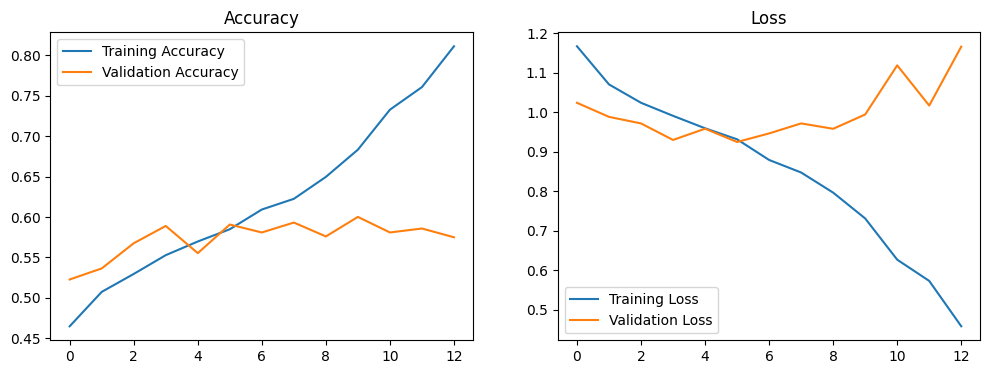

17/17 [==============================] - 17s 580ms/step - loss: 1.0313 - accuracy: 0.5824 - auc_4: 0.7657
Test accuracy: 0.5824
Test AUC: 0.7657


In [52]:
import matplotlib.pyplot as plt
import numpy as np
import os
import tensorflow as tf
from sklearn.model_selection import train_test_split

BATCH_SIZE = 64
IMG_SIZE = (300, 300)

train_dataset = tf.keras.utils.image_dataset_from_directory(train_path,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)
validation_dataset = tf.keras.utils.image_dataset_from_directory(valid_path,
                                                                 shuffle=True,
                                                                 batch_size=BATCH_SIZE,
                                                                 image_size=IMG_SIZE)
test_dataset = tf.keras.utils.image_dataset_from_directory(test_path,
                                                            shuffle=True,
                                                            batch_size=BATCH_SIZE,
                                                            image_size=IMG_SIZE)

class_names = train_dataset.class_names
print("Class names:", class_names)
num_classes = len(class_names)

# Function to convert labels to categorical
def convert_to_categorical(image, label):
    return image, tf.one_hot(label, num_classes)

train_dataset = train_dataset.map(convert_to_categorical)
validation_dataset = validation_dataset.map(convert_to_categorical)
test_dataset = test_dataset.map(convert_to_categorical)

AUTOTUNE = tf.data.AUTOTUNE
train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)
validation_dataset = validation_dataset.prefetch(buffer_size=AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=AUTOTUNE)

preprocess_input = tf.keras.applications.vgg19.preprocess_input

# Create the base model from the pre-trained model VGG19
IMG_SHAPE = IMG_SIZE + (3,)
base_model = tf.keras.applications.VGG19(input_shape=IMG_SHAPE,
                                         include_top=False,
                                         weights='imagenet')
base_model.trainable = True

# Fine-tune from this layer onwards
fine_tune_at = 17
# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

inputs = tf.keras.Input(shape=(300, 300, 3))
x = preprocess_input(inputs)
x = base_model(x, training=False)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = tf.keras.layers.Dense(128, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(x)
model = tf.keras.Model(inputs, outputs)

base_learning_rate = 0.0001
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=base_learning_rate),
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=False),
              metrics=['accuracy', tf.keras.metrics.AUC(multi_label=True, num_labels=num_classes)])

# Callbacks
val_acc_es = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=3, restore_best_weights=True)
model_checkpoint_callback_val_acc = tf.keras.callbacks.ModelCheckpoint(
    filepath='VGG19_Val_Accuracy.hdf5',
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)
auc_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    filepath='VGG19_AUC.hdf5',
    save_weights_only=True,
    monitor='val_auc',
    mode='max',
    save_best_only=True)

total_epochs = 50
history_fine = model.fit(train_dataset,
                         epochs=total_epochs,
                         validation_data=validation_dataset,
                         callbacks=[val_acc_es, model_checkpoint_callback_val_acc, auc_checkpoint])

# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history_fine.history['accuracy'], label='Training Accuracy')
plt.plot(history_fine.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history_fine.history['loss'], label='Training Loss')
plt.plot(history_fine.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')
plt.show()

# Evaluate on test set
test_loss, test_accuracy, test_auc = model.evaluate(test_dataset)
print(f"Test accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")

# Sanity check with more images including Field 1 and 3

In [ ]:
import os
import shutil
import pandas as pd
import cv2
import numpy as np
from pathlib import Path, PurePath

def crop_to_eye(im):
    mask = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(mask, 10, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    max_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(max_contour)
    cropped_im = im[y:y + h, x:x + w]
    return cropped_im

def create_LACDHS_quality_dataset(train_dir: str, validation_dir: str, test_dir: str, output_dir: str, exclude_train: list = [], exclude_valid: list = []) -> tuple:
    """
    Creates a dataset for LACDHS image quality classification by organizing images into train, valid, and test folders
    based on their Subject_image_quality from the subject table, filtered for Field 2 images and cropped to the eye.

    Parameters:
    - train_dir (str): Path to the raw train dataset bag.
    - validation_dir (str): Path to the raw validation dataset bag.
    - test_dir (str): Path to the raw test dataset bag.
    - output_dir (str): Path to the output directory where the organized dataset will be created.
    - exclude_train (list): List of image RIDs to exclude from the train set.
    - exclude_valid (list): List of image RIDs to exclude from the validation set.

    Returns:
    - tuple: A tuple containing the paths to the train, validation, and test directories.
    """
    # def filter_field_2(image_df):
    #     return image_df[image_df['Image_Angle_Vocab'] == "2SK6"]

    def process_dataset(bag_path: str, output_subdir: str, exclude_list: list = []):
        image_csv_path = os.path.join(bag_path, 'data', 'Image.csv')
        observation_csv_path = os.path.join(bag_path, 'data', 'Observation.csv')
        subject_csv_path = os.path.join(bag_path, 'data', 'Subject.csv')

        image_df = pd.read_csv(image_csv_path)
        observation_df = pd.read_csv(observation_csv_path)
        subject_df = pd.read_csv(subject_csv_path)

        # Filter for Field 2 images
        # image_df = filter_field_2(image_df)

        # Merge dataframes
        merged_df = image_df.merge(observation_df, left_on='Observation', right_on='RID')
        merged_df = merged_df.merge(subject_df, left_on='Subject', right_on='RID')

        # Filter for specific quality categories
        quality_categories = ['69XP', '69XJ', '69XT', '69XM'] # # very few images ignoring , '69XR'
        merged_df = merged_df[merged_df['Subject_image_quality'].isin(quality_categories)]

        image_root_path = os.path.join(bag_path, 'data', 'assets', 'Image')

        for _, row in merged_df.iterrows():
            if row['RID_x'] not in exclude_list:  # RID_x is the Image RID
                quality = row['Subject_image_quality']
                filename = row['Filename']
                src_path = os.path.join(image_root_path, filename)
                
                # Read the image
                img = cv2.imread(src_path)
                if img is None:
                    print(f"Warning: Could not read image {src_path}")
                    continue
                
                # Crop the image to the eye
                cropped_img = crop_to_eye(img)
                
                dst_dir = os.path.join(output_dir, output_subdir, quality)
                os.makedirs(dst_dir, exist_ok=True)
                dst_path = os.path.join(dst_dir, filename)
                
                # Save the cropped image
                cv2.imwrite(dst_path, cropped_img)

    # Process train dataset
    process_dataset(train_dir, 'train', exclude_train)

    # Process validation dataset
    process_dataset(validation_dir, 'valid', exclude_valid)

    # Process test dataset
    process_dataset(test_dir, 'test')

    train_path = os.path.join(output_dir, 'train')
    valid_path = os.path.join(output_dir, 'valid')
    test_path = os.path.join(output_dir, 'test')

    return train_path, valid_path, test_path

# very few images ignoring '69XR'


# Van quality check

In [51]:
# # # @title Save Execution Assets (model) and Metadata
# uploaded_assets = EA.execution_upload(configuration_records.execution_rid, True)